In [1]:
import os
import sys
import numpy as np
import pandas as pd
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib
%matplotlib inline

In [14]:
device_df = pd.read_excel('/Users/wesleytatum/Desktop/py-conjugated/data/OPV_device_df.xlsx')
print(device_df.shape)
total_df = pd.read_excel('/Users/wesleytatum/Desktop/py-conjugated/data/OPV_total_df.xlsx')
print(total_df.shape)
device_df

(366, 11)
(36, 60)


,Unnamed: 0,Unnamed: 0.1,File Name,Time (min),Device,Temp (C),PCE,VocL,Jsc,FF,Substrate
0,0,291,2019_4_16_P3HTPCBM_NA_3000_SUB1,0,5,0,0.053196,0.088773,2.319470,25.835041,1
1,1,283,2019_4_16_P3HTPCBM_NA_1000_SUB7,0,5,0,0.323514,0.706579,2.021489,22.649638,7
2,2,284,2019_4_16_P3HTPCBM_NA_1000_SUB7,0,6,0,0.620043,0.665916,1.867738,49.852415,7
3,3,280,2019_4_16_P3HTPCBM_NA_1000_SUB7,0,2,0,0.628255,0.654254,1.915640,50.127434,7
4,4,287,2019_4_16_P3HTPCBM_NA_3000_SUB1,0,1,0,0.637683,0.662407,2.204954,43.659713,1
...,...,...,...,...,...,...,...,...,...,...,...
361,361,89,2019_4_16_P3HTPCBM_150C_15min_3000_SUB3,15,7,150,2.932059,0.582550,7.188190,70.019666,3
362,362,85,2019_4_16_P3HTPCBM_150C_15min_3000_SUB3,15,3,150,3.036853,0.579876,7.438571,70.404362,3
363,363,83,2019_4_16_P3HTPCBM_150C_15min_3000_SUB3,15,1,150,3.046002,0.579518,7.438503,70.660656,3
364,364,84,2019_4_16_P3HTPCBM_150C_15min_3000_SUB3,15,2,150,3.103756,0.578146,7.587212,70.756792,3


In [3]:
total_df.head()

,Unnamed: 0,Anneal_time,Anneal_temp,Substrate,Device,p1_fraction,p2_fraction,p3_fraction,p1_area_avg,p1_area_stdev,...,p3_Ecc_avg,p3_Ecc_stdev,p3_Orient_avg,p3_Orient_stdev,p3_Perim_avg,p3_Perim_stdev,PCE,VocL,Jsc,FF
0,0,15,100,4,2,0.377864,0.397964,0.224172,138.756250,515.165733,...,0.806425,0.141707,-0.028958,1.145651,27.843437,33.295642,2.311387,0.577792,6.963861,57.44484
1,1,15,100,4,4,0.350601,0.368873,0.280526,78.978947,180.249005,...,0.817408,0.147199,0.053783,1.171795,42.334954,73.576430,1.763230,0.522596,7.047848,47.87256
2,2,15,100,4,7,0.290203,0.329655,0.380142,122.638743,246.651556,...,0.840800,0.129785,-0.158463,1.160457,42.913004,88.566792,2.394418,0.575790,6.939877,59.92170
3,3,30,100,7,2,0.255200,0.437277,0.307523,151.263158,607.110300,...,0.836830,0.122449,-0.486800,0.858037,34.541492,46.688722,2.628197,0.569525,7.301575,63.20169
4,4,30,100,7,4,0.363801,0.396645,0.239554,151.330935,441.730661,...,0.817914,0.131814,-0.111498,1.075222,29.762502,28.652323,2.710602,0.568631,7.328048,65.04993


In [29]:
def xyz_unique(df_cols):
    """
    For all z values associated an x, y pair, return the maximum z value.
    Expects 3 pandas columns, with two being annealing time and temperature.
    
    Consolidates x,y,z points to average value of all x,y,z matches
    """
    #get column names as list and remove x & y colnames
    z_col = list(df_cols.columns)
    z_col.remove('Anneal_temp')
    z_col.remove('Anneal_time')
    
    #get unique x and y points
    x_vals = df_cols['Anneal_temp'].unique()
    y_vals = df_cols['Anneal_time'].unique()
    
    X = []
    Y = []
    Z = []
    
    for xv in x_vals:
        for yv in y_vals:
            #for each unique x,y pair, find all z values
            temp_matches = df_cols.query('Anneal_temp == @xv')
            z_vals = temp_matches.query('Anneal_time == @yv')
            z_list = list(z_vals[z_col].values)
            
            if len(z_list) == 0:
                pass
            else:
            #calculate average of identified z values
                avg_z = sum(z_list)/len(z_vals)

                #record final xyz sets in lists
                X.append(xv)
                Y.append(yv)
                Z.append(avg_z)
    
    return X, Y, Z


def xyz_unique_dev_only(df_cols):
    """
    For all z values associated an x, y pair, return the maximum z value.
    Expects 3 pandas columns, with two being annealing time and temperature.
    
    Consolidates x,y,z points to average value of all x,y,z matches
    """
    #get column names as list and remove x & y colnames
    z_col = list(df_cols.columns)
    z_col.remove('Temp (C)')
    z_col.remove('Time (min)')
    
    #get unique x and y points
    x_vals = pd.unique(df_cols['Temp (C)'])
    y_vals = pd.unique(df_cols['Time (min)'])
    
    X = []
    Y = []
    Z = []
    
    for xv in x_vals:
        for yv in y_vals:
            #for each unique x,y pair, find all z values
            temp_matches = df_cols.query('`Temp (C)` == @xv')
            z_vals = temp_matches.query('`Time (min)` == @yv')
            z_list = list(z_vals[z_col].values)
            
            if len(z_list) == 0:
                pass
            else:
            #calculate average of identified z values
                avg_z = sum(z_list)/len(z_vals)

                #record final xyz sets in lists
                X.append(xv)
                Y.append(yv)
                Z.append(avg_z)
    
    return X, Y, Z
    
    
    
def grid(x, y, z, resX=200, resY=200):
    """
    Convert 3 column data to matplotlib grid
    """
    
    xi = np.linspace(min(x), max(x), resX)
    yi = np.linspace(min(y), max(y), resY)
    X, Y = np.meshgrid(xi, yi)
    #griddata(..,method=) both 'linear' and 'poly' won't fit to this data?
    Z = griddata((x, y), z, (X, Y), method = 'nearest')
    Z = Z.reshape(X.shape)
    
    return X, Y, Z

In [5]:
#To plot pretty 3d contour plots, we need to define all 3 axes and make sure they are translated into
#a uniformly spaced grid for ax.contour and ax.plot_surface

df_cols = total_df[['Anneal_time', 'Anneal_temp', 'PCE']]

xx, yy, zz = xyz_unique(df_cols)

# print(xx)
# print(yy)
# print(zz)

print(len(xx))
print(len(yy))
print(len(zz))

#Our x and y axes will correspond to temperature and time, respectively
X, Y, Z = grid(xx, yy, zz)

print(X.shape)
print(Y.shape)
print(Z.shape)
# Z

13
13
13
(200, 200)
(200, 200)
(200, 200)


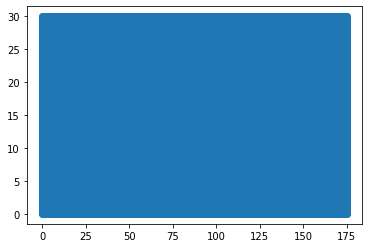

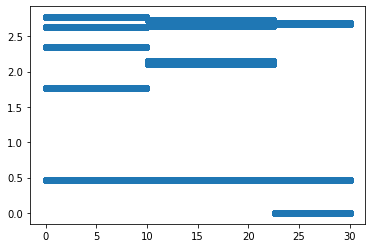

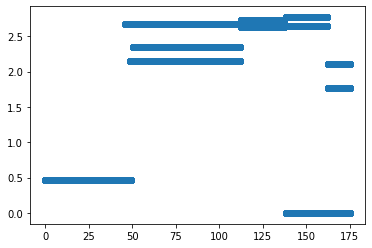

In [6]:
fig, ax = plt.subplots()
plt.scatter(X, Y)
plt.show()

fig, ax = plt.subplots()
plt.scatter(Y, Z)
plt.show()

fig, ax = plt.subplots()
plt.scatter(X, Z)
plt.show()

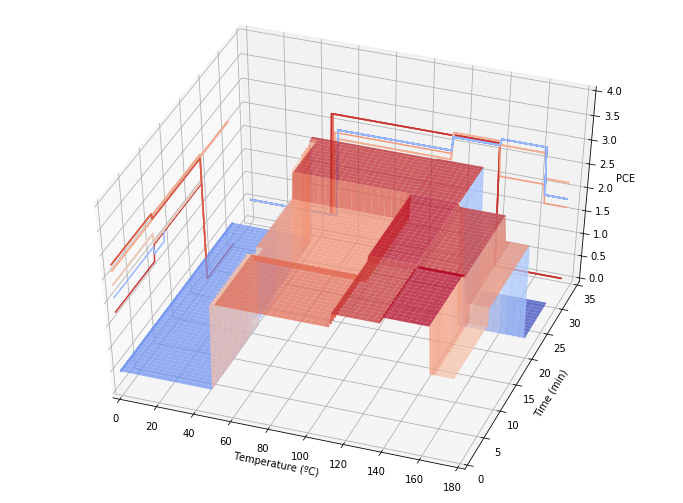

In [7]:
fig = plt.figure(figsize = (12, 9))
ax = fig.gca(projection='3d')

#plot 3D surface
ax.plot_surface(X, Y, Z, cmap = cm.coolwarm, alpha=0.75)

#plot contour lines and offset them onto the walls of the graph
# cset = ax.contour(X, Y, Z, zdir='z', offset = 0, cmap=cm.coolwarm)
cset = ax.contour(X, Y, Z, 20, zdir='x', offset = 0, cmap=cm.coolwarm)
cset = ax.contour(X, Y, Z, 20, zdir='y', offset = 35, cmap=cm.coolwarm)

ax.set_xlabel('Temperature (ºC)')
ax.set_xlim(0, 180)
ax.set_ylabel('Time (min)')
ax.set_ylim(0, 35)
ax.set_zlabel('PCE')
ax.set_zlim(0, 4)
ax.view_init(azim = -70, elev = 45)
plt.savefig('/Users/wesleytatum/Desktop/OPV_PCE_contour.png')

plt.show()

In [8]:
cols = list(total_df.columns)
#skip first 5 columns
cols = cols[5:]

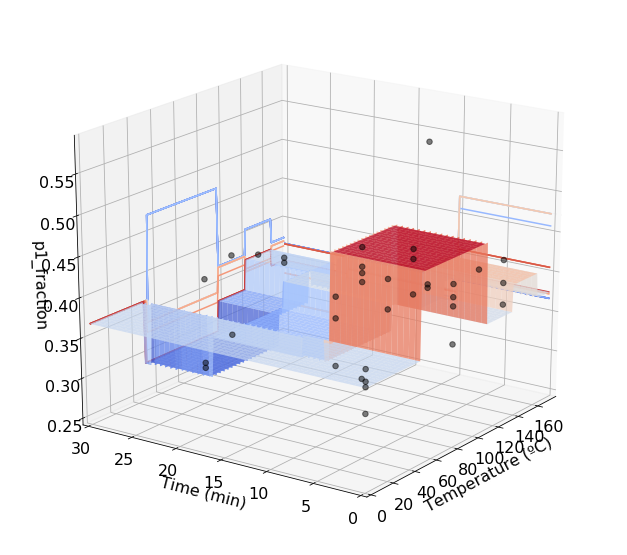

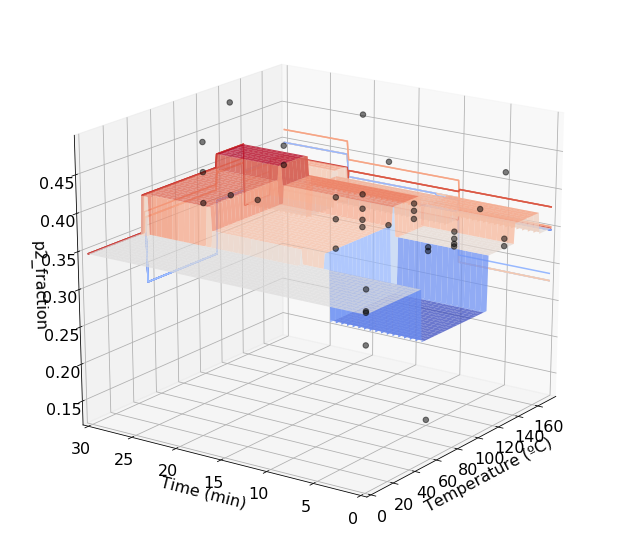

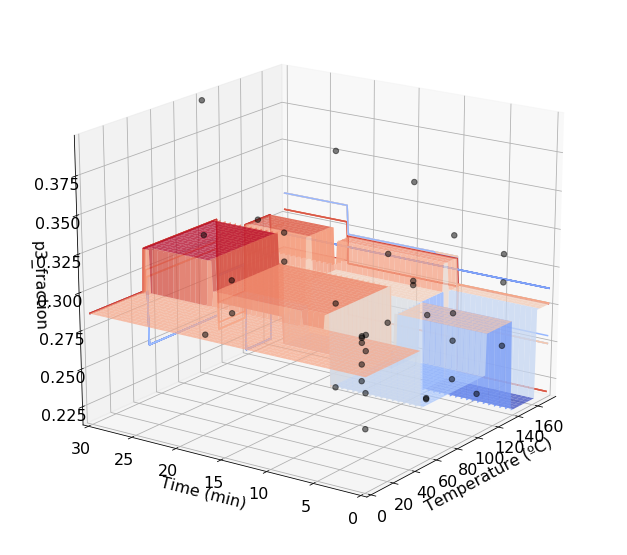

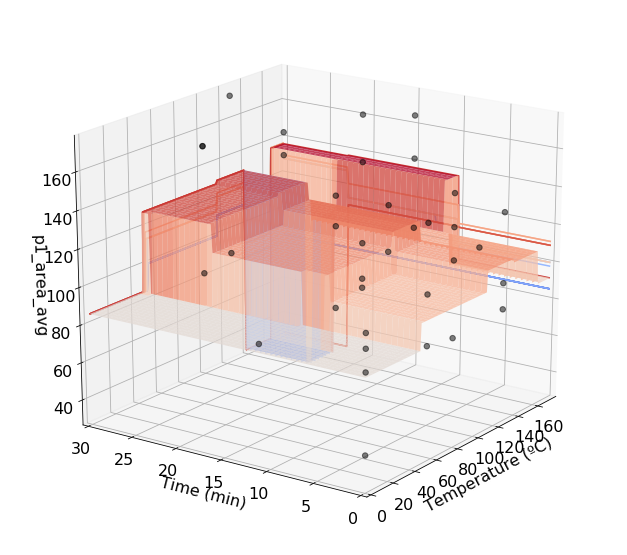

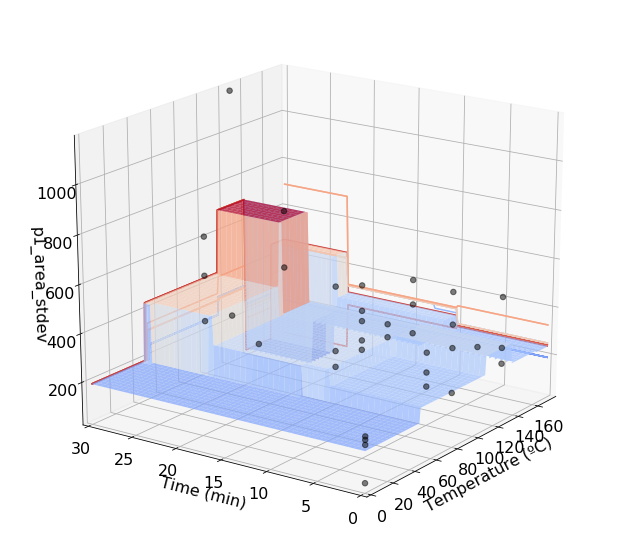

...

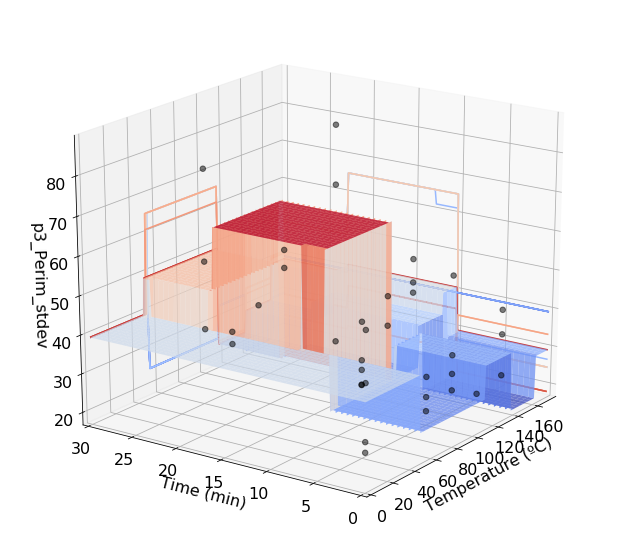

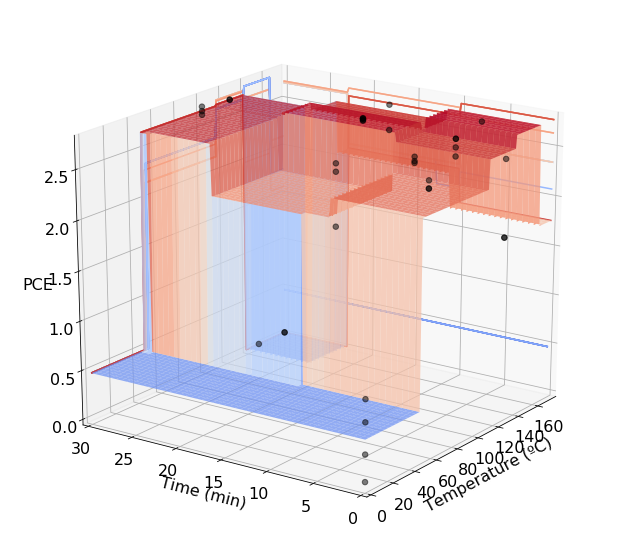

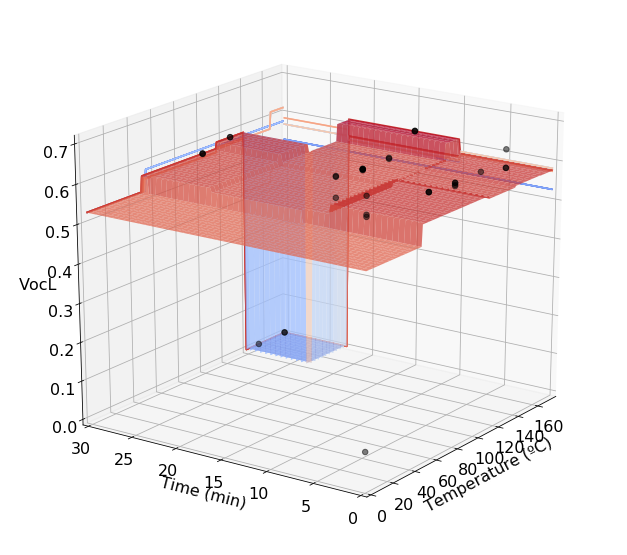

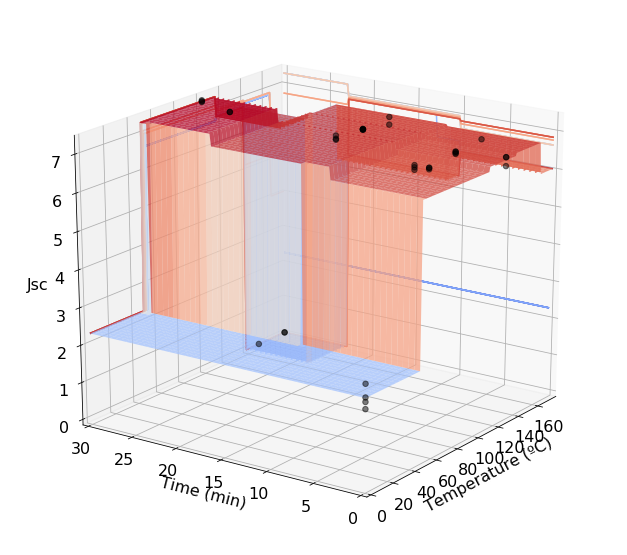

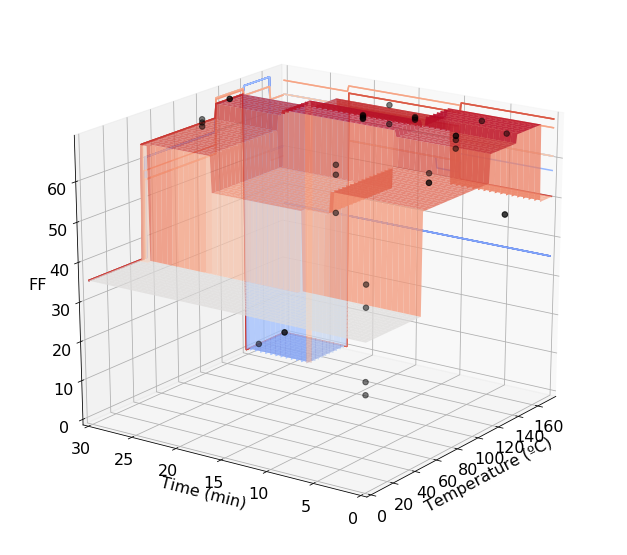

In [9]:
#loop through the above code for every feature in total_df
for colname in cols:

    df_cols = total_df[['Anneal_time', 'Anneal_temp', colname]]
    
    #collect necessary axes shifts to project contour linees onto image walls
    z_min = total_df[colname].min()
    z_max = total_df[colname].max()
    x_min = total_df['Anneal_temp'].min()
    x_max = total_df['Anneal_temp'].max()
    y_min = total_df['Anneal_time'].min()
    y_max = total_df['Anneal_time'].max()

    #call function to average z values to make unique xyz pairs
    xx, yy, zz = xyz_unique(df_cols)

    #Our x and y axes will correspond to temperature and time, respectively
    X, Y, Z = grid(xx, yy, zz)
    
    #Set font properties
    matplotlib.rc('font', size = 16)
    matplotlib.rc('font', family = 'sans-serif')
    
    fig = plt.figure(figsize = (9, 8))
    ax = fig.gca(projection='3d')
    
    #plot scatter plot of column
    ax.scatter3D(df_cols['Anneal_temp'], df_cols['Anneal_time'], df_cols[colname], c = 'k',
                s = 30, alpha = 0.5)

    #plot 3D surface
    ax.plot_surface(X, Y, Z, cmap = cm.coolwarm, alpha=0.75)

    #plot contour lines and offset them onto the walls of the graph
    # cset = ax.contour(X, Y, Z, zdir='z', offset = z_min, cmap=cm.coolwarm)
    cset = ax.contour(X, Y, Z, 20, zdir='x', offset = 175, cmap=cm.coolwarm)
    cset = ax.contour(X, Y, Z, 20, zdir='y', offset = 30, cmap=cm.coolwarm)

    #plot properties
    ax.set_xlabel('Temperature (ºC)', fontsize = 16)
    ax.set_xlim(x_min, x_max)
    ax.set_ylabel('Time (min)', fontsize = 16)
    ax.set_ylim(y_min, y_max)
    ax.set_zlabel(f'{colname}', fontsize = 16)
    ax.set_zlim(z_min, z_max)
    ax.view_init(azim = -145, elev = 20)
    plt.savefig(f'/Users/wesleytatum/Desktop/OPV_{colname}_contour.png')

    plt.tight_layout()
    plt.show()

In [25]:
cols = list(device_df.columns)

#drop uneccesary columns
cols.remove('Device')
cols.remove('Substrate')
cols.remove('Unnamed: 0')
cols.remove('Unnamed: 0.1')
cols.remove('File Name')
cols.remove('Time (min)')
cols.remove('Temp (C)')
print(cols)

['PCE', 'VocL', 'Jsc', 'FF']


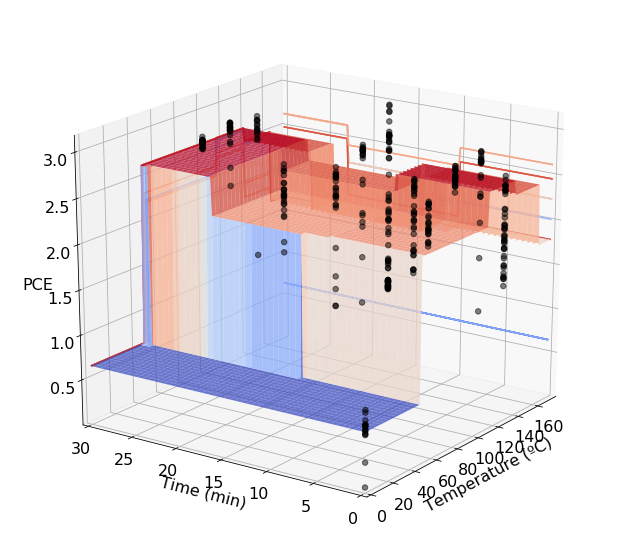

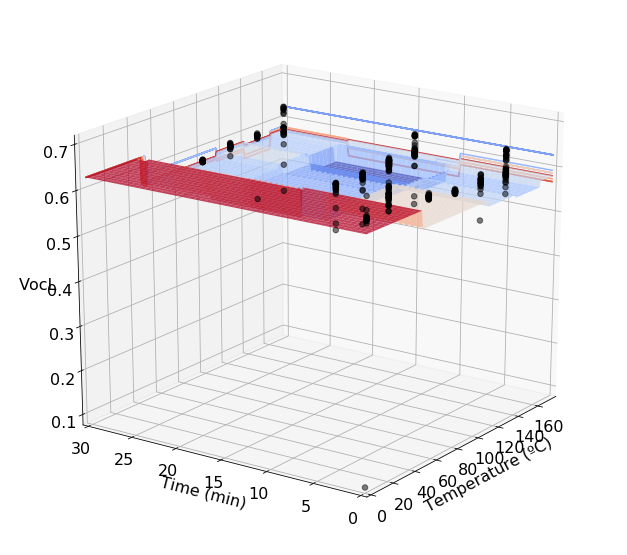

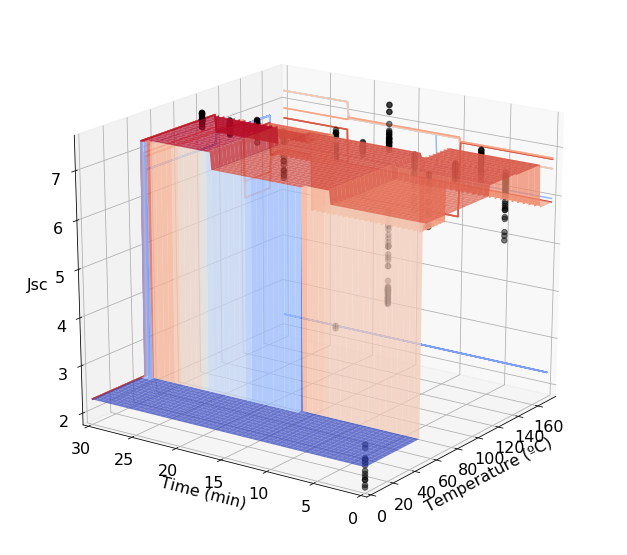

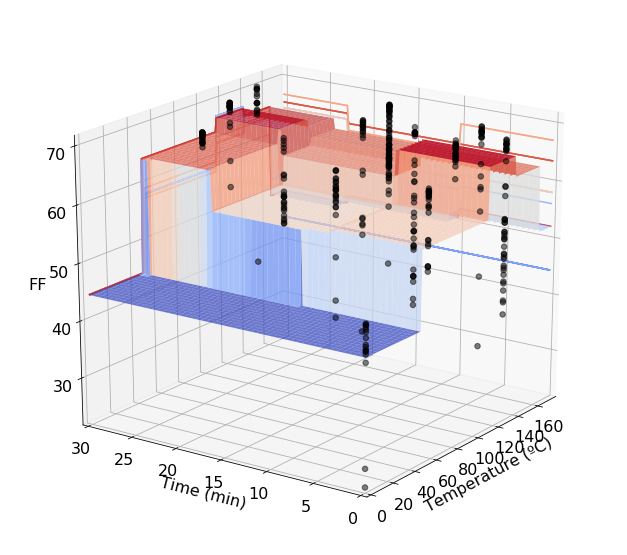

In [31]:
#loop through the above code for every feature in total_df
for colname in cols:

    df_cols = device_df[['Temp (C)', 'Time (min)', colname]]
    
    #collect necessary axes shifts to project contour linees onto image walls
    z_min = device_df[colname].min()
    z_max = device_df[colname].max()
    x_min = device_df['Temp (C)'].min()
    x_max = device_df['Temp (C)'].max()
    y_min = device_df['Time (min)'].min()
    y_max = device_df['Time (min)'].max()

    #call function to average z values to make unique xyz pairs
    xx, yy, zz = xyz_unique_dev_only(df_cols)

    #Our x and y axes will correspond to temperature and time, respectively
    X, Y, Z = grid(xx, yy, zz)
    
    #Set plot font properties
    matplotlib.rc('font', size = 16)
    matplotlib.rc('font', family = 'sans-serif')
    
    #generate figure and axes
    fig = plt.figure(figsize = (9, 8))
    ax = fig.gca(projection='3d')
    
    #plot scatter plot of column
    ax.scatter3D(df_cols['Temp (C)'], df_cols['Time (min)'], df_cols[colname], c = 'k',
                s = 30, alpha = 0.5)

    #plot 3D surface
    ax.plot_surface(X, Y, Z, cmap = cm.coolwarm, alpha=0.75)

    #plot contour lines and offset them onto the walls of the graph
    # cset = ax.contour(X, Y, Z, zdir='z', offset = z_min, cmap=cm.coolwarm)
    cset = ax.contour(X, Y, Z, 20, zdir='x', offset = 175, cmap=cm.coolwarm)
    cset = ax.contour(X, Y, Z, 20, zdir='y', offset = 30, cmap=cm.coolwarm)

    #plot properties
    ax.set_xlabel('Temperature (ºC)', fontsize = 16)
    ax.set_xlim(x_min, x_max)
    ax.set_ylabel('Time (min)', fontsize = 16)
    ax.set_ylim(y_min, y_max)
    ax.set_zlabel(f'{colname}', fontsize = 16)
    ax.set_zlim(z_min, z_max)
    ax.view_init(azim = -145, elev = 20)
    plt.savefig(f'/Users/wesleytatum/Desktop/OPV_devonly_{colname}_contour.png')

    plt.tight_layout()
    plt.show()